In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

/kaggle/input/pm-132419044-at-09-06-2026-05-57-43/__script__.py
/kaggle/input/pm-132419044-at-09-06-2026-05-57-43/__results__.html
/kaggle/input/pm-132419044-at-09-06-2026-05-57-43/input_requirements.txt
/kaggle/input/pm-132419044-at-09-06-2026-05-57-43/__script__.ipynb
/kaggle/input/pm-132419044-at-09-06-2026-05-57-43/__output__.json
/kaggle/input/pm-132419044-at-09-06-2026-05-57-43/custom.css
/kaggle/input/datasets/dptel22/j1v-c2/fire_archive_J1V-C2_794139.csv
/kaggle/input/datasets/dptel22/j1v-c2/fire_nrt_J1V-C2_794139.csv
/kaggle/input/datasets/dptel22/sv-c2snpp/fire_nrt_SV-C2_794140.csv
/kaggle/input/datasets/dptel22/sv-c2snpp/fire_archive_SV-C2_794140.csv


# Import libaries

In [2]:
!pip install pandas numpy scipy statsmodels
!pip install matplotlib seaborn plotly
!pip install geopandas h3 shapely

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 14.8 MB/s eta 0:00:00


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import h3
import warnings

warnings.filterwarnings("ignore")
pd.set_option("display.max_columns", 50)

SATURATION_TEMP = 367.0
SATURATION_BUFFER = 0.1
H3_RES = 8

In [4]:
paths = {
    "j1_archive": "/kaggle/input/datasets/dptel22/j1v-c2/fire_archive_J1V-C2_794139.csv",
    "j1_nrt": "/kaggle/input/datasets/dptel22/j1v-c2/fire_nrt_J1V-C2_794139.csv",
    "snpp_archive": "/kaggle/input/datasets/dptel22/sv-c2snpp/fire_archive_SV-C2_794140.csv",
    "snpp_nrt": "/kaggle/input/datasets/dptel22/sv-c2snpp/fire_nrt_SV-C2_794140.csv",
}

OUTPUT_PATH = "/kaggle/working/sih2026_h3_daily_features.parquet"

print("Configuration loaded.")
print("H3 resolution:", H3_RES)
print("Saturation threshold:", SATURATION_TEMP, "K")

Configuration loaded.
H3 resolution: 8
Saturation threshold: 367.0 K


# Schema Verifcation

In [5]:
for name, path in paths.items():
    check = pd.read_csv(path, nrows=3)
    print(f"\n{name}")
    print("  path:", path)
    print("  columns:", check.columns.tolist())
    print("  satellite sample:", check["satellite"].dropna().unique().tolist())
    print("  acq_time dtype:", check["acq_time"].dtype)

print("\nExpected schema pattern:")
print("  Archive: brightness, bright_t31, ..., type")
print("  NRT:     brightness, bright_t31, ... (no type)")


j1_archive
  path: /kaggle/input/datasets/dptel22/j1v-c2/fire_archive_J1V-C2_794139.csv
  columns: ['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_date', 'acq_time', 'satellite', 'instrument', 'confidence', 'version', 'bright_t31', 'frp', 'daynight', 'type']
  satellite sample: ['N20']
  acq_time dtype: int64

j1_nrt
  path: /kaggle/input/datasets/dptel22/j1v-c2/fire_nrt_J1V-C2_794139.csv
  columns: ['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_date', 'acq_time', 'satellite', 'instrument', 'confidence', 'version', 'bright_t31', 'frp', 'daynight']
  satellite sample: ['N20']
  acq_time dtype: int64

snpp_archive
  path: /kaggle/input/datasets/dptel22/sv-c2snpp/fire_archive_SV-C2_794140.csv
  columns: ['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_date', 'acq_time', 'satellite', 'instrument', 'confidence', 'version', 'bright_t31', 'frp', 'daynight', 'type']
  satellite sample: ['SNPP']
  acq_time dtype: int64

snpp_nrt
  path: /kaggle/input/d

# Ingestion and schema harmonization

In [6]:
dfs = []

for name, path in paths.items():
    df_part = pd.read_csv(path)

    # Preserve provenance.
    df_part["source"] = "archive" if "archive" in name else "nrt"
    df_part["satellite_name"] = "NOAA-20" if "j1" in name else "SUOMI-NPP"

    dfs.append(df_part)

df_raw = pd.concat(dfs, ignore_index=True)

print(f"Total raw rows (archive + NRT, before overlap removal): {len(df_raw):,}")
print("\nRaw satellite values:")
print(df_raw["satellite"].value_counts(dropna=False))

def harmonize_firms_schema(df):
    df = df.copy()

    # Archive -> common VIIRS I-band naming.
    rename_map = {
        "brightness": "bright_ti4",
        "bright_t31": "bright_ti5",
        "type": "fire_type",
    }
    df = df.rename(columns={k: v for k, v in rename_map.items() if k in df.columns})

    # Keep already-standardized values unchanged.
    if "confidence" in df.columns:
        df["confidence"] = df["confidence"].replace({
            "l": "low",
            "n": "nominal",
            "h": "high",
        })

    if "daynight" in df.columns:
        df["daynight"] = df["daynight"].replace({
            "D": "Day",
            "N": "Night",
        })

    # NRT rows have NaN in fire_type after concat because the NRT source
    # does not contain the original archive-only type field.
    if "fire_type" in df.columns:
        is_na = df["fire_type"].isna()

        df["is_static_land"] = np.select(
            [is_na],
            [-1],
            default=(df["fire_type"] == 2).astype(int),
        )

        df["is_offshore"] = np.select(
            [is_na],
            [-1],
            default=(df["fire_type"] == 3).astype(int),
        )
    else:
        df["is_static_land"] = -1
        df["is_offshore"] = -1

    return df

df = harmonize_firms_schema(df_raw)

print(f"Total rows after harmonization: {len(df):,}")
print("Harmonized columns:")
print(df.columns.tolist())

Total raw rows (archive + NRT, before overlap removal): 2,597,596

Raw satellite values:
satellite
N20     1329378
SNPP    1268218
Name: count, dtype: int64
Total rows after harmonization: 2,597,596
Harmonized columns:
['latitude', 'longitude', 'bright_ti4', 'scan', 'track', 'acq_date', 'acq_time', 'satellite', 'instrument', 'confidence', 'version', 'bright_ti5', 'frp', 'daynight', 'fire_type', 'source', 'satellite_name', 'is_static_land', 'is_offshore']


# Tabular EDA

In [7]:
print(f"Date range: {df['acq_date'].min()} to {df['acq_date'].max()}")
print(f"Memory usage: {df.memory_usage(deep=True).sum() / 1e6:.2f} MB")

print("\n--- Missing values (%) ---")
print((df.isnull().mean() * 100).round(2))

print(f"\nExact duplicate rows: {df.duplicated().sum():,}")

numeric_cols = ["bright_ti4", "bright_ti5", "frp", "scan", "track"]
summary = df[numeric_cols].describe(
    percentiles=[0.01, 0.05, 0.25, 0.50, 0.75, 0.95, 0.99]
).T
summary["skew"] = df[numeric_cols].skew()
summary["kurtosis"] = df[numeric_cols].kurtosis()
display(summary)

saturated_mask = df["bright_ti4"] >= (SATURATION_TEMP - SATURATION_BUFFER)

print(
    f"\nSaturated I4 records (>= {SATURATION_TEMP - SATURATION_BUFFER} K): "
    f"{saturated_mask.sum():,} ({saturated_mask.mean() * 100:.2f}%)"
)

print("\nSaturation by satellite:")
print(df.loc[saturated_mask, "satellite_name"].value_counts())

print("\nConfidence distribution (%):")
print((df["confidence"].value_counts(normalize=True) * 100).round(2))

print("\nDay/night distribution (%):")
print((df["daynight"].value_counts(normalize=True) * 100).round(2))

print("\nFire type distribution (archive values + NRT NaN):")
print(df["fire_type"].value_counts(dropna=False))

Date range: 2024-08-01 to 2026-08-01
Memory usage: 1326.00 MB

--- Missing values (%) ---
latitude          0.00
longitude         0.00
bright_ti4        0.00
scan              0.00
track             0.00
acq_date          0.00
acq_time          0.00
satellite         0.00
instrument        0.00
confidence        0.00
version           0.00
bright_ti5        0.00
frp               0.00
daynight          0.00
fire_type         4.65
source            0.00
satellite_name    0.00
is_static_land    0.00
is_offshore       0.00
dtype: float64

Exact duplicate rows: 0


,count,mean,std,min,1%,5%,25%,50%,75%,95%,99%,max,skew,kurtosis
bright_ti4,2597596.0,331.403556,16.937914,207.93,297.34,301.73,316.93,335.35,342.40,354.01,367.00,367.00,-0.488448,0.020878
bright_ti5,2597596.0,301.597048,9.746338,243.18,279.24,286.78,294.12,302.04,308.47,316.69,323.76,387.83,0.076026,0.752853
frp,2597596.0,6.001282,13.162558,0.00,0.43,0.75,1.90,3.52,6.23,16.15,46.60,1074.64,15.836358,445.482722
scan,2597596.0,0.452376,0.081331,0.32,0.32,0.35,0.39,0.43,0.50,0.61,0.73,0.80,1.173411,1.612731
track,2597596.0,0.469152,0.109133,0.36,0.36,0.36,0.38,0.43,0.55,0.69,0.76,0.78,0.926696,-0.178801



Saturated I4 records (>= 366.9 K): 78,309 (3.01%)

Saturation by satellite:
satellite_name
SUOMI-NPP    39909
NOAA-20      38400
Name: count, dtype: int64

Confidence distribution (%):
confidence
nominal    79.63
low        17.83
high        2.54
Name: proportion, dtype: float64

Day/night distribution (%):
daynight
Day      70.61
Night    29.39
Name: proportion, dtype: float64

Fire type distribution (archive values + NRT NaN):
fire_type
0.0    2174507
2.0     298418
NaN     120735
3.0       3912
1.0         24
Name: count, dtype: int64


# Cleaning, timestamp construction, and deduplicatio


In [8]:
# Parse acquisition date.
df["acq_date"] = pd.to_datetime(df["acq_date"], errors="raise")

# Robust acquisition-time validation.
acq_time_num = pd.to_numeric(df["acq_time"], errors="coerce")

assert acq_time_num.notna().all(), "acq_time contains non-numeric values."
assert acq_time_num.between(0, 2359).all(), "acq_time contains values outside 0000–2359."
assert (acq_time_num % 100 < 60).all(), "acq_time contains invalid minute values."

df["acq_time_str"] = (
    acq_time_num
    .round()
    .astype("int64")
    .astype(str)
    .str.zfill(4)
)

df["timestamp"] = pd.to_datetime(
    df["acq_date"].dt.strftime("%Y-%m-%d")
    + " "
    + df["acq_time_str"].str[:2]
    + ":"
    + df["acq_time_str"].str[2:],
    errors="raise",
)

# Remove archive/NRT overlap.
dedup_cols = [
    "latitude",
    "longitude",
    "acq_date",
    "acq_time",
    "satellite",
]

n_before = len(df)
df = df.drop_duplicates(subset=dedup_cols, keep="first").copy()

print(f"Dropped {n_before - len(df):,} archive/NRT overlap rows.")

# Physical sanity filters.
n_before = len(df)
df = df[df["bright_ti4"] > 200].copy()
df = df[df["frp"] >= 0].copy()

print(f"Dropped {n_before - len(df):,} rows via physical sanity filters.")

# ------------------------------------------------------------
# Confidence-based filtering — documented decision (project memory:
# "Confidence field uses full words... Filter must use
# isin(['nominal', 'high'])"), never actually applied to the pipeline
# until now. 'low' confidence in VIIRS is disproportionately sun-glint,
# bare-soil, and cloud-edge false alarms — leaving them in contaminates
# every intensity/count/persistence feature downstream, including the
# active_days_90d mining threshold already calibrated on this data.
# ------------------------------------------------------------
n_before = len(df)
low_conf_count = (df["confidence"] == "low").sum()
low_conf_pct = low_conf_count / n_before * 100
df = df[df["confidence"].isin(["nominal", "high"])].copy()

print(
    f"\nDropped {n_before - len(df):,} low-confidence rows "
    f"({low_conf_count:,} were 'low', {low_conf_pct:.2f}% of pre-filter data)."
)
print(f"Rows remaining after confidence filter: {len(df):,}")

# Captured here (not hardcoded later) so Phase 9A's hard validation checks
# internal consistency of THIS run, not a stale row count from a prior run.
EXPECTED_ROWS_AFTER_CLEANING = len(df)

# IMPORTANT:
# .replace() preserves values that are already standardized.
# - N     -> SNPP
# - N20   -> NOAA20
# - SNPP  -> remains SNPP
df["satellite"] = df["satellite"].replace({
    "N": "SNPP",
    "N20": "NOAA20",
})

print(f"Rows after dedup + cleaning: {len(df):,}")
print("\nSatellite values after harmonization:")
print(df["satellite"].value_counts(dropna=False))

Dropped 2 archive/NRT overlap rows.
Dropped 0 rows via physical sanity filters.

Dropped 463,183 low-confidence rows (463,183 were 'low', 17.83% of pre-filter data).
Rows remaining after confidence filter: 2,134,411
Rows after dedup + cleaning: 2,134,411

Satellite values after harmonization:
satellite
NOAA20    1091377
SNPP      1043034
Name: count, dtype: int64


# Visual EDA

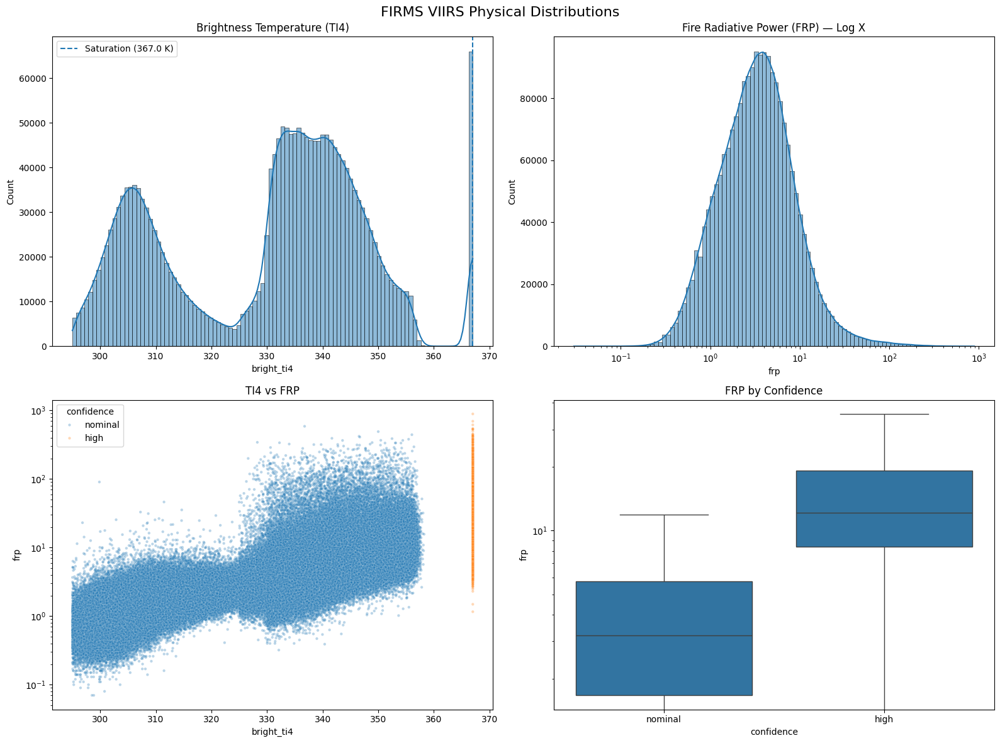

In [9]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("FIRMS VIIRS Physical Distributions", fontsize=16)

sns.histplot(
    df["bright_ti4"],
    bins=100,
    kde=True,
    ax=axes[0, 0],
)
axes[0, 0].axvline(
    SATURATION_TEMP,
    linestyle="--",
    label=f"Saturation ({SATURATION_TEMP} K)",
)
axes[0, 0].set_title("Brightness Temperature (TI4)")
axes[0, 0].legend()

sns.histplot(
    df.loc[df["frp"] > 0, "frp"],
    bins=100,
    kde=True,
    ax=axes[0, 1],
    log_scale=(True, False),
)
axes[0, 1].set_title("Fire Radiative Power (FRP) — Log X")

sample = df.sample(frac=0.20, random_state=42)

sns.scatterplot(
    data=sample,
    x="bright_ti4",
    y="frp",
    hue="confidence",
    alpha=0.30,
    s=10,
    ax=axes[1, 0],
)
axes[1, 0].set_yscale("log")
axes[1, 0].set_title("TI4 vs FRP")

sns.boxplot(
    x="confidence",
    y="frp",
    data=df,
    ax=axes[1, 1],
    showfliers=False,
)
axes[1, 1].set_yscale("log")
axes[1, 1].set_title("FRP by Confidence")

plt.tight_layout()
plt.show()

# Temporal EDA


In [10]:
# FIRMS acquisition time is UTC.
# Convert to IST for India-focused diurnal analysis.
df["timestamp_ist"] = df["timestamp"] + pd.Timedelta(hours=5, minutes=30)
df["hour_ist"] = df["timestamp_ist"].dt.hour
df["date_only"] = df["acq_date"].dt.date

daily_counts = (
    df.groupby("date_only")
      .size()
      .reset_index(name="count")
)

fig_daily = px.line(
    daily_counts,
    x="date_only",
    y="count",
    title="Daily Thermal Anomaly Counts",
    labels={"date_only": "Date", "count": "Detections"},
)
fig_daily.show()

fig_hourly = px.histogram(
    df,
    x="hour_ist",
    color="daynight",
    barmode="overlay",
    title="Satellite Pass Times (IST)",
    labels={"hour_ist": "Hour (IST)", "count": "Detections"},
)
fig_hourly.show()

# Phase 6: Spatial EDA

In [11]:
# 6.1 Overall spatial distribution — lightweight point layer

# Smaller sample for readability.
map_sample = df.sample(
    n=min(20000, len(df)),
    random_state=42
).copy()

fig = px.scatter_mapbox(
    map_sample,
    lat="latitude",
    lon="longitude",
    color="frp",
    size_max=6,
    opacity=0.35,
    zoom=4,
    mapbox_style="open-street-map",
    hover_data={
        "latitude": ":.4f",
        "longitude": ":.4f",
        "frp": ":.2f",
        "bright_ti4": ":.2f",
        "confidence": True,
        "satellite_name": True,
        "acq_date": True,
    },
    title="Spatial Distribution of VIIRS Thermal Anomalies"
)

fig.update_traces(marker=dict(size=4))

fig.update_layout(
    height=700,
    margin=dict(l=0, r=0, t=50, b=0)
)

fig.show()


# 6.2 High-FRP hotspot analysis

# Use the top 2% FRP detections.
frp_threshold = df["frp"].quantile(0.98)

high_frp = df[df["frp"] >= frp_threshold].copy()

print(f"98th percentile FRP threshold: {frp_threshold:.2f}")
print(f"High-FRP detections: {len(high_frp):,}")

fig_hot = px.scatter_mapbox(
    high_frp,
    lat="latitude",
    lon="longitude",
    color="frp",
    size="frp",
    size_max=12,
    opacity=0.65,
    zoom=4,
    mapbox_style="open-street-map",
    hover_data={
        "latitude": ":.4f",
        "longitude": ":.4f",
        "frp": ":.2f",
        "bright_ti4": ":.2f",
        "confidence": True,
        "satellite_name": True,
        "acq_date": True,
    },
    title="High-FRP Spatial Hotspots (Top 2%)"
)

fig_hot.update_layout(
    height=700,
    margin=dict(l=0, r=0, t=50, b=0)
)

fig_hot.show()
# 6.3 Spatial density map

fig_density = px.density_mapbox(
    map_sample,
    lat="latitude",
    lon="longitude",
    z="frp",
    radius=12,
    zoom=4,
    mapbox_style="open-street-map",
    title="Spatial Density of Thermal Anomalies"
)

fig_density.update_layout(
    height=700,
    margin=dict(l=0, r=0, t=50, b=0)
)

fig_density.show()

98th percentile FRP threshold: 27.76
High-FRP detections: 42,691


# H3 SPATIAL AGGREGATION TO DAILY GRID

In [12]:
# H3 resolution 8 is used as the daily spatial modeling unit.
# Each VIIRS detection is assigned to an H3 cell and then
# aggregated by H3 cell + acquisition date.

# ------------------------------------------------------------
# 1. Assign every detection to an H3 resolution-8 cell
# ------------------------------------------------------------

# List comprehension is substantially faster than
# df.apply(axis=1) for large datasets.
df["h3_08"] = [
    h3.latlng_to_cell(lat, lon, H3_RES)
    for lat, lon in zip(
        df["latitude"],
        df["longitude"]
    )
]

# Validate H3 assignment before continuing.
assert df["h3_08"].notna().all(), (
    "H3 assignment produced missing values"
)

print(f"Unique H3 cells: {df['h3_08'].nunique():,}")

# ------------------------------------------------------------
# 2. Flag VIIRS I4 saturation
# ------------------------------------------------------------

df["is_saturated"] = (
    df["bright_ti4"] >= (
        SATURATION_TEMP - SATURATION_BUFFER
    )
).astype(int)

# ------------------------------------------------------------
# Day/night-masked FRP columns for the aggregation below.
#
# VIIRS daytime MIR channel has known solar-contamination
# sensitivity -- nighttime detections are the more reliable
# signal for persistent/subtle sources (mining, industrial,
# gas flares folded into industrial). Blending day+night into
# a single frp_max/n_detections per H3-day throws this away.
# np.where + max/count-of-non-null in the agg below gives clean
# per-regime features without a second groupby pass.
# ------------------------------------------------------------

df["frp_night_masked"] = np.where(df["daynight"] == "Night", df["frp"], np.nan)
df["frp_day_masked"] = np.where(df["daynight"] == "Day", df["frp"], np.nan)

# ------------------------------------------------------------
# 3. Aggregate detections to H3 cell + acquisition date
# ------------------------------------------------------------

df_daily = (
    df
    .groupby(
        ["h3_08", "acq_date"],
        as_index=False
    )
    .agg(
        # Fire intensity
        frp_max=("frp", "max"),
        frp_mean=("frp", "mean"),
        n_detections=("frp", "count"),

        # Thermal characteristics
        ti4_max=("bright_ti4", "max"),
        is_saturated_max=("is_saturated", "max"),

        # VIIRS observation geometry
        scan_mean=("scan", "mean"),
        track_mean=("track", "mean"),

        # Confidence -- boolean kept for backward compatibility, but a
        # single any() bit loses the difference between "1 of 20 detections
        # was high-confidence" and "18 of 20 were". pct_high_confidence
        # keeps that gradient (data here is already isin(['nominal','high'])
        # post the Cell 12 fix, so this is a nominal-vs-high split, not
        # contaminated by 'low').
        confidence_high_any=(
            "confidence",
            lambda x: (x == "high").any()
        ),
        pct_high_confidence=(
            "confidence",
            lambda x: (x == "high").mean()
        ),

        # Day/night-split intensity + count -- see masked columns above.
        frp_max_night=("frp_night_masked", "max"),
        frp_max_day=("frp_day_masked", "max"),
        n_detections_night=("frp_night_masked", lambda x: x.notna().sum()),
        n_detections_day=("frp_day_masked", lambda x: x.notna().sum()),

        # Viewing geometry -- scan/track MEAN was already tracked, but mean
        # masks the off-nadir extremes that matter most (VIIRS bowtie effect:
        # pixel footprint grows substantially off-nadir, degrading both
        # spatial precision and FRP accuracy for that detection). MAX
        # captures the worst-case footprint for the day-cell.
        scan_max=("scan", "max"),
        track_max=("track", "max"),

        # Day/night
        daynight=(
            "daynight",
            lambda x: (
                "Both"
                if len(set(x)) > 1
                else x.iloc[0]
            )
        ),

        # Number of unique observing satellites
        satellite_nunique=(
            "satellite",
            "nunique"
        ),

        # Archive-derived fire-type flags
        # -1 = unknown / NRT
        #  0 = false
        #  1 = true
        is_static_land=(
            "is_static_land",
            "max"
        ),

        is_offshore=(
            "is_offshore",
            "max"
        ),
    )
)

# ------------------------------------------------------------
# 4. Sort immediately for downstream temporal operations
# ------------------------------------------------------------

df_daily = (
    df_daily
    .sort_values(
        ["h3_08", "acq_date"]
    )
    .reset_index(drop=True)
)

print(
    f"Unique H3-days aggregated: "
    f"{len(df_daily):,}"
)

print(
    f"Unique H3 cells in daily table: "
    f"{df_daily['h3_08'].nunique():,}"
)

# Consistency check: overall frp_max must equal the max of the day/night
# split (treating an all-NaN side as -inf). Catches a masking bug immediately
# rather than silently producing two disagreeing versions of "max FRP".
_check = df_daily[["frp_max_night", "frp_max_day"]].max(axis=1, skipna=True)
_mismatch = (df_daily["frp_max"] - _check).abs().gt(1e-6) & _check.notna()
assert not _mismatch.any(), (
    f"ERROR: frp_max disagrees with max(frp_max_night, frp_max_day) on "
    f"{_mismatch.sum():,} rows -- day/night masking bug, fix before continuing."
)
print("Day/night FRP split consistency check passed.")
del _check, _mismatch

# Clean up intermediate masked columns from the DETECTION-level df -- they
# were only needed for this aggregation, not for anything else in df.
df.drop(columns=["frp_night_masked", "frp_day_masked"], inplace=True)

# Capture here (not hardcoded downstream) -- Phase 9A's hard validation
# checks against THIS run's actual counts, not a stale number from before
# the confidence filter changed the row/cell counts.
EXPECTED_H3_DAILY_ROWS = len(df_daily)
EXPECTED_H3_CELLS = df_daily["h3_08"].nunique()

display(df_daily.head())

Unique H3 cells: 798,705
Unique H3-days aggregated: 1,442,545
Unique H3 cells in daily table: 798,705
Day/night FRP split consistency check passed.


,h3_08,acq_date,frp_max,frp_mean,n_detections,ti4_max,is_saturated_max,scan_mean,track_mean,confidence_high_any,pct_high_confidence,frp_max_night,frp_max_day,n_detections_night,n_detections_day,scan_max,track_max,daynight,satellite_nunique,is_static_land,is_offshore
0,88209a2011fffff,2025-01-26,5.22,5.22,1,337.16,0,0.430,0.380,False,0.0,NaN,5.22,0,1,0.43,0.38,Day,1,0,0
1,88209a2087fffff,2025-12-15,8.42,8.42,1,347.39,0,0.380,0.590,False,0.0,NaN,8.42,0,1,0.38,0.59,Day,1,0,0
2,88209a208dfffff,2024-10-10,0.87,0.87,1,302.61,0,0.410,0.370,False,0.0,0.87,NaN,1,0,0.41,0.37,Night,1,0,0
3,88209a20a7fffff,2024-11-06,5.17,5.17,1,328.81,0,0.540,0.680,False,0.0,NaN,5.17,0,1,0.54,0.68,Day,1,0,0
4,88209a20a7fffff,2024-11-07,3.83,2.54,2,327.67,0,0.445,0.385,False,0.0,3.83,NaN,2,0,0.47,0.40,Night,2,0,0


In [13]:
# Collapse the H3-day table across the complete observation
# period to understand which cells repeatedly contain
# thermal anomalies.

h3_spatial = (
    df_daily
    .groupby(
        "h3_08",
        as_index=False
    )
    .agg(
        # Total number of VIIRS detections in the cell
        total_detections=(
            "n_detections",
            "sum"
        ),

        # Number of distinct days on which the cell was active
        active_days=(
            "acq_date",
            "nunique"
        ),

        # Strongest observed FRP in the cell
        max_frp=(
            "frp_max",
            "max"
        ),

        # Mean daily FRP across active days
        mean_frp=(
            "frp_mean",
            "mean"
        ),
    )
)

print(
    f"Unique H3 cells in spatial summary: "
    f"{len(h3_spatial):,}"
)

print("\n--- Top 20 H3 cells by total detections ---")

display(
    h3_spatial
    .sort_values(
        "total_detections",
        ascending=False
    )
    .head(20)
)

print("\n--- Top 20 H3 cells by active days ---")

display(
    h3_spatial
    .sort_values(
        "active_days",
        ascending=False
    )
    .head(20)
)

print("\n--- Top 20 H3 cells by maximum FRP ---")

display(
    h3_spatial
    .sort_values(
        "max_frp",
        ascending=False
    )
    .head(20)
)

Unique H3 cells in spatial summary: 798,705

--- Top 20 H3 cells by total detections ---


,h3_08,total_detections,active_days,max_frp,mean_frp
166607,883ca9c95bfffff,3932,569,14.79,2.977508
57609,883c817b29fffff,3474,545,18.36,3.151354
88493,883c85d9c3fffff,3402,549,35.33,5.184708
139926,883ca04021fffff,3325,570,19.26,3.296303
162823,883ca826e9fffff,3148,547,13.53,2.683398
557305,8842d9d2e5fffff,2958,599,41.76,5.767001
70412,883c83b5d3fffff,2532,543,20.52,4.056128
101243,883c8d8ae9fffff,2424,552,12.09,3.037855
557306,8842d9d2e7fffff,2327,594,47.93,7.140472
104413,883c8e8ee7fffff,2226,507,47.05,3.932230



--- Top 20 H3 cells by active days ---


,h3_08,total_detections,active_days,max_frp,mean_frp
557305,8842d9d2e5fffff,2958,599,41.76,5.767001
557306,8842d9d2e7fffff,2327,594,47.93,7.140472
139926,883ca04021fffff,3325,570,19.26,3.296303
166607,883ca9c95bfffff,3932,569,14.79,2.977508
101243,883c8d8ae9fffff,2424,552,12.09,3.037855
88493,883c85d9c3fffff,3402,549,35.33,5.184708
557304,8842d9d2e3fffff,1381,547,55.27,6.292976
162823,883ca826e9fffff,3148,547,13.53,2.683398
57609,883c817b29fffff,3474,545,18.36,3.151354
166649,883ca9cb07fffff,2153,543,11.07,2.694976



--- Top 20 H3 cells by maximum FRP ---


,h3_08,total_detections,active_days,max_frp,mean_frp
234220,883cc15a8bfffff,1,1,890.08,890.080000
238406,883cc34f19fffff,7,1,717.23,216.491429
244948,883cc56c99fffff,4,1,696.49,204.952500
244953,883cc56cd3fffff,4,2,696.49,391.720000
230588,883cc08c95fffff,2,2,685.38,388.490000
272121,883ceac2dbfffff,15,9,652.27,54.664444
228996,883cc064d9fffff,10,3,639.44,65.196190
233402,883cc1401bfffff,3,1,616.22,267.990000
233501,883cc142a7fffff,4,2,616.22,203.472500
233426,883cc140cdfffff,1,1,616.22,616.220000


In [14]:
# Do NOT attempt to render all ~900k H3 cells.
# Plot only the most active cells so the map remains responsive
# and visually interpretable.

TOP_H3 = 5000

h3_plot = (
    h3_spatial
    .sort_values(
        "total_detections",
        ascending=False
    )
    .head(TOP_H3)
    .copy()
)

print(
    f"Rendering {len(h3_plot):,} most active H3 cells "
    f"out of {len(h3_spatial):,} total cells."
)

# ------------------------------------------------------------
# Convert H3 cells to GeoJSON polygons
# ------------------------------------------------------------

def h3_polygon(cell):
    # h3.cell_to_boundary() returns:
    # [(lat, lon), ...]
    #
    # GeoJSON expects:
    # [(lon, lat), ...]

    boundary = h3.cell_to_boundary(cell)

    return [
        [lon, lat]
        for lat, lon in boundary
    ]


# List comprehension avoids unnecessary pandas apply overhead.
h3_plot["polygon"] = [
    h3_polygon(cell)
    for cell in h3_plot["h3_08"]
]

features = [
    {
        "type": "Feature",
        "id": row["h3_08"],
        "geometry": {
            "type": "Polygon",
            "coordinates": [row["polygon"]],
        },
        "properties": {
            "h3_08": row["h3_08"],
            "total_detections": int(
                row["total_detections"]
            ),
            "active_days": int(
                row["active_days"]
            ),
            "max_frp": float(
                row["max_frp"]
            ),
        },
    }
    for _, row in h3_plot.iterrows()
]

h3_geojson = {
    "type": "FeatureCollection",
    "features": features,
}

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig_h3 = px.choropleth_mapbox(
    h3_plot,
    geojson=h3_geojson,
    locations="h3_08",
    featureidkey="id",

    # Color = how often this spatial cell was active
    color="total_detections",

    hover_name="h3_08",

    hover_data={
        "total_detections": True,
        "active_days": True,
        "max_frp": ":.2f",
        "h3_08": False,
    },

    mapbox_style="open-street-map",

    # South Asia view
    zoom=4,

    title=(
        f"H3 Resolution-{H3_RES} "
        f"Detection Density — Top {TOP_H3} Cells"
    ),
)

fig_h3.update_layout(
    height=750,
    margin=dict(
        l=0,
        r=0,
        t=55,
        b=0
    ),
)

fig_h3.show()

Rendering 5,000 most active H3 cells out of 798,705 total cells.


In [15]:
# Detection frequency and thermal intensity represent
# different spatial phenomena.
#
# This map highlights cells containing the strongest
# observed thermal anomalies.

h3_frp_plot = (
    h3_spatial
    .sort_values(
        "max_frp",
        ascending=False
    )
    .head(TOP_H3)
    .copy()
)

print(
    f"Rendering {len(h3_frp_plot):,} "
    f"highest-FRP H3 cells."
)

# ------------------------------------------------------------
# Convert H3 cells to polygons
# ------------------------------------------------------------

h3_frp_plot["polygon"] = [
    h3_polygon(cell)
    for cell in h3_frp_plot["h3_08"]
]

features_frp = [
    {
        "type": "Feature",
        "id": row["h3_08"],
        "geometry": {
            "type": "Polygon",
            "coordinates": [row["polygon"]],
        },
        "properties": {
            "h3_08": row["h3_08"],
            "total_detections": int(
                row["total_detections"]
            ),
            "active_days": int(
                row["active_days"]
            ),
            "max_frp": float(
                row["max_frp"]
            ),
        },
    }
    for _, row in h3_frp_plot.iterrows()
]

h3_geojson_frp = {
    "type": "FeatureCollection",
    "features": features_frp,
}

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig_h3_frp = px.choropleth_mapbox(
    h3_frp_plot,
    geojson=h3_geojson_frp,
    locations="h3_08",
    featureidkey="id",

    # Color = maximum observed FRP
    color="max_frp",

    hover_name="h3_08",

    hover_data={
        "max_frp": ":.2f",
        "total_detections": True,
        "active_days": True,
        "h3_08": False,
    },

    mapbox_style="open-street-map",

    zoom=4,

    title=(
        f"H3 Resolution-{H3_RES} "
        f"Highest-FRP Hotspots — Top {TOP_H3} Cells"
    ),
)

fig_h3_frp.update_layout(
    height=750,
    margin=dict(
        l=0,
        r=0,
        t=55,
        b=0
    ),
)

fig_h3_frp.show()

Rendering 5,000 highest-FRP H3 cells.


# CALENDAR-AWARE LEAKAGE-SAFE ROLLING FEATURES

In [16]:
# ============================================================
# PHASE 8: FAST CALENDAR-AWARE LEAKAGE-SAFE ROLLING FEATURES
# ============================================================

# Purpose:
# Add historical context to every H3-day row.
#
# Historical features describe what happened in the SAME H3
# cell BEFORE the current acquisition date.
#
# IMPORTANT:
# shift(1) happens BEFORE rolling.
# Therefore today's observation cannot leak into today's
# historical features.
#
# This implementation DOES NOT use groupby.apply().
# That is critical because this dataset has ~921k H3 cells.

import gc

print("=" * 70)
print("PHASE 8 — FAST ROLLING FEATURES")
print("=" * 70)

# ------------------------------------------------------------
# 1. Sort once
# ------------------------------------------------------------

df_daily = (
    df_daily
    .sort_values(
        ["h3_08", "acq_date"]
    )
    .reset_index(drop=True)
)

print(f"\nRows: {len(df_daily):,}")
print(f"Unique H3 cells: {df_daily['h3_08'].nunique():,}")
print(
    f"Date range: "
    f"{df_daily['acq_date'].min()} → "
    f"{df_daily['acq_date'].max()}"
)

# ------------------------------------------------------------
# 2. Create leakage-safe previous-day features
# ------------------------------------------------------------

# Previous FRP within the SAME H3 cell.
#
# First observation of every H3 cell becomes NaN.

df_daily["frp_prev"] = (
    df_daily
    .groupby(
        "h3_08",
        sort=False
    )["frp_max"]
    .shift(1)
)

# Every row in df_daily represents one active H3-day.
#
# Therefore:
#   first row of a cell = 0 previous active days
#   subsequent rows     = 1 previous active day
#
# This is calculated before rolling.

df_daily["active_prev"] = (
    df_daily
    .groupby(
        "h3_08",
        sort=False
    )
    .cumcount()
    .gt(0)
    .astype("int8")
)

print("\nPrevious-observation columns created.")

# ------------------------------------------------------------
# 3. Temporary rolling input
# ------------------------------------------------------------

rolling_input = df_daily[
    [
        "h3_08",
        "acq_date",
        "frp_prev",
        "active_prev",
    ]
].copy()

# Keep acquisition date as the time column.
# The H3 cell remains the grouping column.

# ============================================================
# 4. 7-DAY HISTORICAL WINDOW
# ============================================================

print("\nCalculating 7-day historical features...")

rolling_7d = (
    rolling_input
    .groupby(
        "h3_08",
        sort=False
    )
    .rolling(
        "7D",
        on="acq_date",
        min_periods=1
    )[
        [
            "frp_prev",
            "active_prev",
        ]
    ]
    .agg({
        "frp_prev": "max",
        "active_prev": "sum",
    })
    .reset_index()
)

rolling_7d = rolling_7d.rename(
    columns={
        "frp_prev": "frp_max_lag7",
        "active_prev": "active_days_7d",
    }
)

# ------------------------------------------------------------
# Verify exact row alignment before assigning values
# ------------------------------------------------------------

assert rolling_7d[
    ["h3_08", "acq_date"]
].reset_index(drop=True).equals(
    df_daily[
        ["h3_08", "acq_date"]
    ].reset_index(drop=True)
), "7D rolling output is not aligned with df_daily."

df_daily["frp_max_lag7"] = (
    rolling_7d["frp_max_lag7"].to_numpy()
)

df_daily["active_days_7d"] = (
    rolling_7d["active_days_7d"].to_numpy()
)

del rolling_7d
gc.collect()

print("7-day features complete.")

# ============================================================
# 5. 30-DAY HISTORICAL WINDOW
# ============================================================

print("\nCalculating 30-day historical features...")

rolling_30d = (
    rolling_input
    .groupby(
        "h3_08",
        sort=False
    )
    .rolling(
        "30D",
        on="acq_date",
        min_periods=1
    )[
        [
            "frp_prev",
            "active_prev",
        ]
    ]
    .agg({
        "frp_prev": "max",
        "active_prev": "sum",
    })
    .reset_index()
)

rolling_30d = rolling_30d.rename(
    columns={
        "frp_prev": "frp_max_lag30",
        "active_prev": "active_days_30d",
    }
)

# ------------------------------------------------------------
# Verify alignment
# ------------------------------------------------------------

assert rolling_30d[
    ["h3_08", "acq_date"]
].reset_index(drop=True).equals(
    df_daily[
        ["h3_08", "acq_date"]
    ].reset_index(drop=True)
), "30D rolling output is not aligned with df_daily."

df_daily["frp_max_lag30"] = (
    rolling_30d["frp_max_lag30"].to_numpy()
)

df_daily["active_days_30d"] = (
    rolling_30d["active_days_30d"].to_numpy()
)

del rolling_30d
gc.collect()

print("30-day features complete.")

# ============================================================
# 6. 90-DAY HISTORICAL WINDOW
# ============================================================

print("\nCalculating 90-day historical features...")

rolling_90d = (
    rolling_input
    .groupby(
        "h3_08",
        sort=False
    )
    .rolling(
        "90D",
        on="acq_date",
        min_periods=1
    )[
        [
            "frp_prev",
            "active_prev",
        ]
    ]
    .agg({
        "frp_prev": "max",
        "active_prev": "sum",
    })
    .reset_index()
)

rolling_90d = rolling_90d.rename(
    columns={
        "active_prev": "active_days_90d",
    }
)

# We only need active_days_90d from the 90-day pass.
# There is intentionally NO frp_max_lag90 feature.

# ------------------------------------------------------------
# Verify alignment
# ------------------------------------------------------------

assert rolling_90d[
    ["h3_08", "acq_date"]
].reset_index(drop=True).equals(
    df_daily[
        ["h3_08", "acq_date"]
    ].reset_index(drop=True)
), "90D rolling output is not aligned with df_daily."

df_daily["active_days_90d"] = (
    rolling_90d["active_days_90d"].to_numpy()
)

del rolling_90d
del rolling_input
gc.collect()

print("90-day features complete.")

# ------------------------------------------------------------
# 7. Temporary columns are no longer needed
# ------------------------------------------------------------

df_daily.drop(
    columns=[
        "frp_prev",
        "active_prev",
    ],
    inplace=True,
)

# ------------------------------------------------------------
# 8. Restore final ordering
# ------------------------------------------------------------

df_daily = (
    df_daily
    .sort_values(
        ["h3_08", "acq_date"]
    )
    .reset_index(drop=True)
)

print("\n" + "=" * 70)
print("PHASE 8 COMPLETE")
print("=" * 70)

print(
    f"\nRows: {len(df_daily):,}"
)

print(
    f"Unique H3 cells: "
    f"{df_daily['h3_08'].nunique():,}"
)

print("\nCreated features:")
print("  frp_max_lag7")
print("  frp_max_lag30")
print("  active_days_7d")
print("  active_days_30d")
print("  active_days_90d")

display(
    df_daily[
        [
            "h3_08",
            "acq_date",
            "frp_max",
            "frp_max_lag7",
            "frp_max_lag30",
            "active_days_7d",
            "active_days_30d",
            "active_days_90d",
        ]
    ].head(20)
)

PHASE 8 — FAST ROLLING FEATURES

Rows: 1,442,545
Unique H3 cells: 798,705
Date range: 2024-08-01 00:00:00 → 2026-08-01 00:00:00

Previous-observation columns created.

Calculating 7-day historical features...
7-day features complete.

Calculating 30-day historical features...
30-day features complete.

Calculating 90-day historical features...
90-day features complete.

PHASE 8 COMPLETE

Rows: 1,442,545
Unique H3 cells: 798,705

Created features:
  frp_max_lag7
  frp_max_lag30
  active_days_7d
  active_days_30d
  active_days_90d


,h3_08,acq_date,frp_max,frp_max_lag7,frp_max_lag30,active_days_7d,active_days_30d,active_days_90d
0,88209a2011fffff,2025-01-26,5.22,NaN,NaN,0.0,0.0,0.0
1,88209a2087fffff,2025-12-15,8.42,NaN,NaN,0.0,0.0,0.0
2,88209a208dfffff,2024-10-10,0.87,NaN,NaN,0.0,0.0,0.0
3,88209a20a7fffff,2024-11-06,5.17,NaN,NaN,0.0,0.0,0.0
4,88209a20a7fffff,2024-11-07,3.83,5.17,5.17,1.0,1.0,1.0
5,88209a20a9fffff,2024-12-30,1.04,NaN,NaN,0.0,0.0,0.0
6,88209a20abfffff,2025-12-14,2.85,NaN,NaN,0.0,0.0,0.0
7,88209a20abfffff,2025-12-15,16.22,2.85,2.85,1.0,1.0,1.0
8,88209a20b3fffff,2025-11-26,1.24,NaN,NaN,0.0,0.0,0.0
9,88209a20b9fffff,2025-12-16,14.92,NaN,NaN,0.0,0.0,0.0


In [17]:
# ============================================================
# PHASE 8A: ROLLING FEATURE VALIDATION
# ============================================================

rolling_cols = [
    "frp_max_lag7",
    "frp_max_lag30",
    "active_days_7d",
    "active_days_30d",
    "active_days_90d",
]

print("=" * 70)
print("PHASE 8A — ROLLING FEATURE VALIDATION")
print("=" * 70)

# ------------------------------------------------------------
# 1. Missing-value check
# ------------------------------------------------------------

print("\n--- Missing values ---")

display(
    df_daily[rolling_cols]
    .isna()
    .sum()
)

# FRP lag features can legitimately have NaN for an H3 cell's
# first observed day.
#
# Active-day features should contain numeric zeros/values.

assert (
    df_daily[
        [
            "active_days_7d",
            "active_days_30d",
            "active_days_90d",
        ]
    ]
    .isna()
    .sum()
    .sum()
) == 0, (
    "ERROR: active-day rolling features contain unexpected NaN."
)

# ------------------------------------------------------------
# 2. Range checks
# ------------------------------------------------------------

print("\n--- Active-day ranges ---")

print(
    "7D :",
    df_daily["active_days_7d"].min(),
    "→",
    df_daily["active_days_7d"].max()
)

print(
    "30D:",
    df_daily["active_days_30d"].min(),
    "→",
    df_daily["active_days_30d"].max()
)

print(
    "90D:",
    df_daily["active_days_90d"].min(),
    "→",
    df_daily["active_days_90d"].max()
)

assert df_daily["active_days_7d"].between(
    0, 7
).all(), "ERROR: active_days_7d outside 0–7."

assert df_daily["active_days_30d"].between(
    0, 30
).all(), "ERROR: active_days_30d outside 0–30."

assert df_daily["active_days_90d"].between(
    0, 90
).all(), "ERROR: active_days_90d outside 0–90."

print("\nActive-day range checks passed.")

# ------------------------------------------------------------
# 3. Feature summary
# ------------------------------------------------------------

print("\n--- Rolling feature summary ---")

display(
    df_daily[rolling_cols].describe(
        percentiles=[
            0.50,
            0.75,
            0.90,
            0.95,
            0.99,
        ]
    )
)

PHASE 8A — ROLLING FEATURE VALIDATION

--- Missing values ---


frp_max_lag7       798705
frp_max_lag30      798705
active_days_7d          0
active_days_30d         0
active_days_90d         0
dtype: int64


--- Active-day ranges ---
7D : 0.0 → 7.0
30D: 0.0 → 30.0
90D: 0.0 → 90.0

Active-day range checks passed.

--- Rolling feature summary ---


,frp_max_lag7,frp_max_lag30,active_days_7d,active_days_30d,active_days_90d
count,643840.000000,643840.000000,1.442545e+06,1.442545e+06,1.442545e+06
mean,5.856546,6.412032,9.125767e-01,2.411641e+00,5.679223e+00
std,11.972672,12.551787,1.573979e+00,5.969579e+00,1.637642e+01
min,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00
50%,3.480000,3.880000,0.000000e+00,0.000000e+00,0.000000e+00
75%,6.240000,6.870000,1.000000e+00,1.000000e+00,1.000000e+00
90%,10.850000,11.750000,3.000000e+00,7.000000e+00,1.600000e+01
95%,15.990000,17.460000,5.000000e+00,1.900000e+01,4.800000e+01
99%,42.670000,45.930000,7.000000e+00,2.800000e+01,8.100000e+01
max,696.490000,696.490000,7.000000e+00,3.000000e+01,9.000000e+01


In [18]:
# ============================================================
# PHASE 8B: EXPLICIT TEMPORAL LEAKAGE CHECK
# ============================================================

print("=" * 70)
print("PHASE 8B — TEMPORAL LEAKAGE CHECK")
print("=" * 70)

# The first observed day of every H3 cell has no history.
#
# Therefore:
#   frp_max_lag7      = NaN
#   frp_max_lag30     = NaN
#   active_days_7d    = 0
#   active_days_30d   = 0
#   active_days_90d   = 0

first_rows = (
    df_daily
    .sort_values(
        ["h3_08", "acq_date"]
    )
    .groupby(
        "h3_08",
        sort=False
    )
    .head(1)
)

print(
    f"First observed H3-days checked: "
    f"{len(first_rows):,}"
)

# First row cannot have previous FRP.
assert first_rows[
    "frp_max_lag7"
].isna().all(), (
    "ERROR: first H3-day has a 7D historical FRP value."
)

assert first_rows[
    "frp_max_lag30"
].isna().all(), (
    "ERROR: first H3-day has a 30D historical FRP value."
)

# First row cannot have previous active days.
assert (
    first_rows["active_days_7d"] == 0
).all(), (
    "ERROR: first H3-day has previous 7D activity."
)

assert (
    first_rows["active_days_30d"] == 0
).all(), (
    "ERROR: first H3-day has previous 30D activity."
)

assert (
    first_rows["active_days_90d"] == 0
).all(), (
    "ERROR: first H3-day has previous 90D activity."
)

print("\nFirst-day historical-feature check passed.")

# ------------------------------------------------------------
# Verify chronological order
# ------------------------------------------------------------

is_sorted = (
    df_daily
    .groupby("h3_08")["acq_date"]
    .apply(lambda x: x.is_monotonic_increasing)
    .all()
)

assert is_sorted, (
    "ERROR: H3 dates are not monotonically increasing."
)

print("H3 chronological-order check passed.")

print("\n" + "=" * 70)
print("PHASE 8 LEAKAGE CHECK PASSED")
print("=" * 70)

PHASE 8B — TEMPORAL LEAKAGE CHECK
First observed H3-days checked: 798,705

First-day historical-feature check passed.
H3 chronological-order check passed.

PHASE 8 LEAKAGE CHECK PASSED


In [19]:
# ============================================================
# PHASE 8C: CALENDAR / SEASONALITY FEATURES
# ============================================================

# Purpose:
# Agricultural burning follows two national VIIRS-documented
# windows (Mar-May rabi residue, Oct-Nov kharif residue) that
# the current agri_burn rule (farmland proximity + FRP ceiling)
# does not use at all. These features expose that signal to
# both the labeling rule (osi-wri-data.ipynb) and the model.
#
# LEAKAGE: none. acq_month/doy_sin/doy_cos are deterministic
# functions of acq_date, which is already present and parsed
# for every row (Cell 12) before this point -- no history,
# no future information, no fit statistic derived from data.

print("=" * 70)
print("PHASE 8C — CALENDAR / SEASONALITY FEATURES")
print("=" * 70)

df_daily["acq_month"] = df_daily["acq_date"].dt.month.astype("int8")

_doy = df_daily["acq_date"].dt.dayofyear.astype("float32")
df_daily["doy_sin"] = np.sin(2 * np.pi * _doy / 365.25).astype("float32")
df_daily["doy_cos"] = np.cos(2 * np.pi * _doy / 365.25).astype("float32")

# ------------------------------------------------------------
# Validation
# ------------------------------------------------------------

assert df_daily["acq_month"].between(1, 12).all(), (
    "ERROR: acq_month outside 1-12."
)

assert df_daily["doy_sin"].between(-1.0, 1.0).all(), (
    "ERROR: doy_sin outside [-1, 1]."
)

assert df_daily["doy_cos"].between(-1.0, 1.0).all(), (
    "ERROR: doy_cos outside [-1, 1]."
)

assert df_daily[["acq_month", "doy_sin", "doy_cos"]].isna().sum().sum() == 0, (
    "ERROR: unexpected NaN in calendar features (acq_date should be "
    "fully populated -- see Cell 12's errors='raise' parse)."
)

print("\nCalendar feature range checks passed.")
print(f"acq_month range: {df_daily['acq_month'].min()} → {df_daily['acq_month'].max()}")
print(f"doy_sin range:   {df_daily['doy_sin'].min():.4f} → {df_daily['doy_sin'].max():.4f}")
print(f"doy_cos range:   {df_daily['doy_cos'].min():.4f} → {df_daily['doy_cos'].max():.4f}")

print("\n--- acq_month distribution ---")
display(df_daily["acq_month"].value_counts().sort_index())


PHASE 8C — CALENDAR / SEASONALITY FEATURES

Calendar feature range checks passed.
acq_month range: 1 → 12
doy_sin range:   -1.0000 → 1.0000
doy_cos range:   -1.0000 → 1.0000

--- acq_month distribution ---


acq_month
1     109204
2     150817
3     349872
4     292602
5     150576
6      31719
7       5756
8       5492
9      11164
10     40642
11    153068
12    141633
Name: count, dtype: int64

# FEATURE FINALIZATION + HARD VALIDATION

In [20]:
# ============================================================
# PHASE 9: FEATURE FINALIZATION
# ============================================================

# Purpose:
# Convert Phase 8's raw rolling output into a model-ready
# table for CatBoost: explicit missingness flags instead of
# lossy fills, dtype downcasting, and a clean feature manifest.

print("=" * 70)
print("PHASE 9 — FEATURE FINALIZATION")
print("=" * 70)

print(f"\nRows before finalization: {len(df_daily):,}")
print(f"Memory before: {df_daily.memory_usage(deep=True).sum() / 1e6:.2f} MB")

# ------------------------------------------------------------
# 1. Explicit missingness flag for lag features
# ------------------------------------------------------------

# frp_max_lag7 and frp_max_lag30 share the identical NaN mask
# (both are NaN iff this is the H3 cell's first-ever observed
# active day). One flag covers both.

df_daily["is_first_observation"] = (
    df_daily["frp_max_lag7"].isna().astype("int8")
)

# ------------------------------------------------------------
# Off-nadir quality flag -- REMOVED FROM THIS NOTEBOOK (2026-09-01).
#
# LEAKAGE FIX: this used to compute is_off_nadir here by fitting a
# 90th-percentile cutoff on scan_max/track_max over the ENTIRE
# nationwide df_daily. At this point in the pipeline there is no
# state/geography column yet (that's assigned later, in
# osi-wri-data.ipynb), so there was no way to restrict the fit to
# TRAIN states from inside this notebook. That's a leak: a threshold
# derived from data that includes the two blind test splits
# (Test A: Gujarat, Tamil Nadu; Test B: Jharkhand, Rajasthan).
#
# is_off_nadir is now computed downstream in osi-wri-data.ipynb,
# AFTER state assignment, fit on TRAIN states only (Maharashtra,
# Karnataka, Madhya Pradesh, Punjab, Andhra Pradesh, Telangana) and
# then applied as a frozen cutoff to every row nationwide (train +
# both blind test sets).
#
# scan_max / track_max themselves are kept below -- they're raw
# per-cell-day aggregates (a max over that day's detections), not a
# fit statistic, so there's no leakage in retaining them here.
# ------------------------------------------------------------

assert (
    df_daily["is_first_observation"].sum()
    == df_daily["frp_max_lag7"].isna().sum()
    == df_daily["frp_max_lag30"].isna().sum()
), "frp_max_lag7 / frp_max_lag30 NaN masks diverge — investigate before finalizing."

print(
    f"\nFirst-observation rows flagged: "
    f"{df_daily['is_first_observation'].sum():,}"
)

# NaNs in frp_max_lag7 / frp_max_lag30 are kept intentionally —
# CatBoost handles missing numerics natively. Do NOT fillna(0)
# here; see notebook notes on why that collides with real FRP=0.

# ------------------------------------------------------------
# 2. is_static_land / is_labeled -- LEGACY EDA-STAGE FLAGS, NOT THE
# TRAINING TARGET. Corrected 2026-08-31: this used to be framed below
# as "target_col" in the feature manifest, which is stale and wrong --
# the actual training labels (industrial/mining/agricultural_burn/
# wildfire) come from the Phase 6 proximity-rule system in
# osi-wri-data.ipynb, not from this archive-only fire_type flag.
# is_static_land is kept as a diagnostic/exploratory feature only.
#
# NOTE ALSO: this is_labeled means "archive fire_type was known for
# this row" -- a DIFFERENT meaning from osi-wri-data.ipynb's is_labeled
# column (which means "Phase 6 assigned a class label"). The latter
# overwrites this one when that notebook runs bootstrap_labels(), so
# it's not currently causing a bug -- but don't read this column's
# semantics into the other notebook or vice versa.
# ------------------------------------------------------------

# is_static_land: -1 = unknown (no archive-derived fire_type that
# day, i.e. NRT-only), 0 = vegetation-type detection that day,
# 1 = at least one static-land-source (industrial-proxy) detection.

df_daily["is_labeled"] = (
    df_daily["is_static_land"] != -1
).astype("int8")

print(
    f"\nRows with known archive fire_type (is_labeled, EDA-stage "
    f"meaning only): "
    f"{df_daily['is_labeled'].sum():,} "
    f"({df_daily['is_labeled'].mean() * 100:.2f}%)"
)

# ------------------------------------------------------------
# 3. Dtype downcasting
# ------------------------------------------------------------

dtype_map = {
    "h3_08": "category",
    "daynight": "category",
    "frp_max": "float32",
    "frp_mean": "float32",
    "ti4_max": "float32",
    "scan_mean": "float32",
    "track_mean": "float32",
    "frp_max_lag7": "float32",
    "frp_max_lag30": "float32",
    "n_detections": "int16",
    "satellite_nunique": "int8",
    "is_saturated_max": "int8",
    "is_static_land": "int8",
    "is_offshore": "int8",
    "active_days_7d": "int8",
    "active_days_30d": "int8",
    "active_days_90d": "int8",
    # New in this fix pass (2026-08-31):
    "pct_high_confidence": "float32",
    "frp_max_night": "float32",
    "frp_max_day": "float32",
    "n_detections_night": "int16",
    "n_detections_day": "int16",
    "scan_max": "float32",
    "track_max": "float32",
    # New in this fix pass (2026-09-06): Phase 8C calendar features.
    "acq_month": "int8",
    "doy_sin": "float32",
    "doy_cos": "float32",
    # is_off_nadir intentionally NOT downcast/listed here -- it is no
    # longer computed in this notebook (see removal note above).
}

for col, dtype in dtype_map.items():
    df_daily[col] = df_daily[col].astype(dtype)

print("\nDtype downcasting applied.")

print(f"\nMemory after: {df_daily.memory_usage(deep=True).sum() / 1e6:.2f} MB")

# ------------------------------------------------------------
# 4. Feature manifest for downstream CatBoost training
# ------------------------------------------------------------

identifier_cols = ["h3_08", "acq_date"]
# NOT the training target -- is_static_land/is_labeled here are legacy
# EDA-stage archive-derived flags, kept as diagnostic-only fields. The
# real training target (industrial/mining/agricultural_burn/wildfire)
# is assigned downstream by Phase 6 in osi-wri-data.ipynb.
legacy_diagnostic_flag_not_a_target = "is_static_land"
legacy_diagnostic_label_mask_not_a_target = "is_labeled"

categorical_features = ["daynight"]

numeric_features = [
    "frp_max", "frp_mean", "n_detections", "ti4_max",
    "is_saturated_max", "scan_mean", "track_mean",
    "satellite_nunique", "is_offshore",
    "frp_max_lag7", "frp_max_lag30",
    "active_days_7d", "active_days_30d", "active_days_90d",
    "is_first_observation",
    # New in this fix pass (2026-08-31):
    "pct_high_confidence",
    "frp_max_night", "frp_max_day",
    "n_detections_night", "n_detections_day",
    "scan_max", "track_max",
    # New in this fix pass (2026-09-06): Phase 8C calendar/seasonality
    # features -- deterministic from acq_date, no leakage (see Phase 8C).
    "acq_month", "doy_sin", "doy_cos",
    # NOTE: is_off_nadir is NOT listed here -- it is computed downstream
    # in osi-wri-data.ipynb after state assignment (TRAIN-states-only
    # fit) and should be appended to the feature list there, not here.
]

boolean_features = ["confidence_high_any"]

print("\n--- Feature manifest ---")
print(f"Identifiers ({len(identifier_cols)}): {identifier_cols}")
print(
    f"NOTE: no 'target_col' here on purpose -- the real training label "
    f"comes from osi-wri-data.ipynb's Phase 6, not this notebook. "
    f"'{legacy_diagnostic_flag_not_a_target}' / "
    f"'{legacy_diagnostic_label_mask_not_a_target}' are diagnostic-only."
)
print(f"Categorical ({len(categorical_features)}): {categorical_features}")
print(f"Boolean ({len(boolean_features)}): {boolean_features}")
print(f"Numeric ({len(numeric_features)}): {numeric_features}")

print("\n" + "=" * 70)
print("PHASE 9 COMPLETE")
print("=" * 70)

display(df_daily.head(10))

PHASE 9 — FEATURE FINALIZATION

Rows before finalization: 1,442,545
Memory before: 448.07 MB

First-observation rows flagged: 798,705

Rows with known archive fire_type (is_labeled, EDA-stage meaning only): 1,382,028 (95.80%)

Dtype downcasting applied.

Memory after: 192.08 MB

--- Feature manifest ---
Identifiers (2): ['h3_08', 'acq_date']
NOTE: no 'target_col' here on purpose -- the real training label comes from osi-wri-data.ipynb's Phase 6, not this notebook. 'is_static_land' / 'is_labeled' are diagnostic-only.
Categorical (1): ['daynight']
Boolean (1): ['confidence_high_any']
Numeric (25): ['frp_max', 'frp_mean', 'n_detections', 'ti4_max', 'is_saturated_max', 'scan_mean', 'track_mean', 'satellite_nunique', 'is_offshore', 'frp_max_lag7', 'frp_max_lag30', 'active_days_7d', 'active_days_30d', 'active_days_90d', 'is_first_observation', 'pct_high_confidence', 'frp_max_night', 'frp_max_day', 'n_detections_night', 'n_detections_day', 'scan_max', 'track_max', 'acq_month', 'doy_sin', 'doy

,h3_08,acq_date,frp_max,frp_mean,n_detections,ti4_max,is_saturated_max,scan_mean,track_mean,confidence_high_any,pct_high_confidence,frp_max_night,frp_max_day,n_detections_night,n_detections_day,scan_max,track_max,daynight,satellite_nunique,is_static_land,is_offshore,frp_max_lag7,active_days_7d,frp_max_lag30,active_days_30d,active_days_90d,acq_month,doy_sin,doy_cos,is_first_observation,is_labeled
0,88209a2011fffff,2025-01-26,5.220000,5.220000,1,337.160004,0,0.430,0.380,False,0.0,NaN,5.220000,0,1,0.43,0.38,Day,1,0,0,NaN,0,NaN,0,0,1,0.432499,0.901634,1,1
1,88209a2087fffff,2025-12-15,8.420000,8.420000,1,347.390015,0,0.380,0.590,False,0.0,NaN,8.420000,0,1,0.38,0.59,Day,1,0,0,NaN,0,NaN,0,0,12,-0.275913,0.961183,1,1
2,88209a208dfffff,2024-10-10,0.870000,0.870000,1,302.609985,0,0.410,0.370,False,0.0,0.87,NaN,1,0,0.41,0.37,Night,1,0,0,NaN,0,NaN,0,0,10,-0.985056,0.172236,1,1
3,88209a20a7fffff,2024-11-06,5.170000,5.170000,1,328.809998,0,0.540,0.680,False,0.0,NaN,5.170000,0,1,0.54,0.68,Day,1,0,0,NaN,0,NaN,0,0,11,-0.803548,0.595240,1,1
4,88209a20a7fffff,2024-11-07,3.830000,2.540000,2,327.670013,0,0.445,0.385,False,0.0,3.83,NaN,2,0,0.47,0.40,Night,2,0,0,5.17,1,5.17,1,1,11,-0.793190,0.608975,0,1
5,88209a20a9fffff,2024-12-30,1.040000,1.040000,1,298.160004,0,0.470,0.400,False,0.0,1.04,NaN,1,0,0.47,0.40,Night,1,0,0,NaN,0,NaN,0,0,12,-0.004301,0.999991,1,1
6,88209a20abfffff,2025-12-14,2.850000,2.850000,1,331.130005,0,0.380,0.360,False,0.0,NaN,2.850000,0,1,0.38,0.36,Day,1,0,0,NaN,0,NaN,0,0,12,-0.292406,0.956294,1,1
7,88209a20abfffff,2025-12-15,16.219999,16.219999,1,346.279999,0,0.540,0.680,False,0.0,NaN,16.219999,0,1,0.54,0.68,Day,1,0,0,2.85,1,2.85,1,1,12,-0.275913,0.961183,0,1
8,88209a20b3fffff,2025-11-26,1.240000,0.830000,2,305.399994,0,0.445,0.390,False,0.0,1.24,NaN,2,0,0.47,0.40,Night,2,0,0,NaN,0,NaN,0,0,11,-0.569901,0.821713,1,1
9,88209a20b9fffff,2025-12-16,14.920000,11.880000,4,349.690002,0,0.655,0.640,False,0.0,NaN,14.920000,0,4,0.68,0.74,Day,2,0,0,NaN,0,NaN,0,0,12,-0.259338,0.965787,1,1


In [21]:
# ============================================================
# PHASE 9A: HARD VALIDATION
# ============================================================

print("=" * 70)
print("PHASE 9A — HARD VALIDATION")
print("=" * 70)

# ------------------------------------------------------------
# 1. Row/cell integrity — finalization must not drop anything
# ------------------------------------------------------------

# Was hardcoded to a stale literal (1_718_002 / 921_202) from a run
# BEFORE the confidence filter was added -- that literal would fail on
# every future run since the row count legitimately changes now.
# Checking against THIS run's own captured counts instead (see cell 20
# for EXPECTED_H3_DAILY_ROWS / EXPECTED_H3_CELLS) -- still catches a
# real "finalization silently dropped/added rows" bug, just without
# baking in a number that goes stale the moment upstream filtering changes.
assert len(df_daily) == EXPECTED_H3_DAILY_ROWS, (
    f"ERROR: row count changed during finalization "
    f"({len(df_daily):,} != {EXPECTED_H3_DAILY_ROWS:,})."
)

assert df_daily["h3_08"].nunique() == EXPECTED_H3_CELLS, (
    f"ERROR: H3 cell count changed during finalization "
    f"({df_daily['h3_08'].nunique():,} != {EXPECTED_H3_CELLS:,})."
)

print("\nRow/cell integrity check passed.")

# ------------------------------------------------------------
# 2. NaN allowlist — only the two lag columns may be NaN
# ------------------------------------------------------------

allowed_nan_cols = {
    "frp_max_lag7", "frp_max_lag30",
    # New in this fix pass: legitimately NaN when an H3-day had zero
    # detections in that regime (e.g. day-only pass -> frp_max_night is NaN).
    "frp_max_night", "frp_max_day",
}

nan_counts = df_daily.isna().sum()
unexpected_nan = nan_counts[
    (nan_counts > 0) & (~nan_counts.index.isin(allowed_nan_cols))
]

assert unexpected_nan.empty, (
    f"ERROR: unexpected NaN outside allowlist:\n{unexpected_nan}"
)

print("\nNaN allowlist check passed.")
print("\n--- Remaining NaN (expected) ---")
display(nan_counts[nan_counts > 0])

# ------------------------------------------------------------
# 3. Lag NaN count must equal is_first_observation count
# ------------------------------------------------------------

assert (
    df_daily["frp_max_lag7"].isna().sum()
    == df_daily["is_first_observation"].sum()
), "ERROR: is_first_observation flag drifted from actual NaN count."

print("is_first_observation consistency check passed.")

# ------------------------------------------------------------
# 4. Target label coverage report (not gated — reporting only)
# ------------------------------------------------------------

print("\n--- is_static_land distribution (target) ---")
display(df_daily["is_static_land"].value_counts(dropna=False))

print(
    f"\nUnlabeled H3-days (is_static_land == -1): "
    f"{(df_daily['is_static_land'] == -1).sum():,} "
    f"({(df_daily['is_static_land'] == -1).mean() * 100:.2f}%)"
)

# ------------------------------------------------------------
# 5. Dtype / memory report
# ------------------------------------------------------------

print("\n--- Final dtypes ---")
display(df_daily.dtypes)

print(f"\nFinal memory usage: {df_daily.memory_usage(deep=True).sum() / 1e6:.2f} MB")

print("\n" + "=" * 70)
print("PHASE 9A VALIDATION PASSED")
print("=" * 70)

PHASE 9A — HARD VALIDATION

Row/cell integrity check passed.

NaN allowlist check passed.

--- Remaining NaN (expected) ---


frp_max_night    986683
frp_max_day      425710
frp_max_lag7     798705
frp_max_lag30    798705
dtype: int64

is_first_observation consistency check passed.

--- is_static_land distribution (target) ---


is_static_land
 0    1234697
 1     147331
-1      60517
Name: count, dtype: int64


Unlabeled H3-days (is_static_land == -1): 60,517 (4.20%)

--- Final dtypes ---


h3_08                         category
acq_date                datetime64[ns]
frp_max                        float32
frp_mean                       float32
n_detections                     int16
ti4_max                        float32
is_saturated_max                  int8
scan_mean                      float32
track_mean                     float32
confidence_high_any               bool
pct_high_confidence            float32
frp_max_night                  float32
frp_max_day                    float32
n_detections_night               int16
n_detections_day                 int16
scan_max                       float32
track_max                      float32
daynight                      category
satellite_nunique                 int8
is_static_land                    int8
is_offshore                       int8
frp_max_lag7                   float32
active_days_7d                    int8
frp_max_lag30                  float32
active_days_30d                   int8
active_days_90d          


Final memory usage: 192.08 MB

PHASE 9A VALIDATION PASSED


In [22]:
# ============================================================
# PHASE 9B: SAVE FINALIZED FEATURE TABLE
# ============================================================

print("=" * 70)
print("PHASE 9B — SAVE FINALIZED FEATURE TABLE")
print("=" * 70)

df_daily.to_parquet(OUTPUT_PATH, index=False)

print(f"\nSaved to: {OUTPUT_PATH}")

# Verify round-trip integrity before trusting the saved file.
df_check = pd.read_parquet(OUTPUT_PATH)

assert len(df_check) == len(df_daily), (
    "ERROR: row count mismatch after parquet round-trip."
)

assert list(df_check.columns) == list(df_daily.columns), (
    "ERROR: column order/set mismatch after parquet round-trip."
)

del df_check
gc.collect()

print("Round-trip verification passed.")

print("\n" + "=" * 70)
print("PHASE 9 FULLY COMPLETE — feature table ready for modeling")
print("=" * 70)

PHASE 9B — SAVE FINALIZED FEATURE TABLE

Saved to: /kaggle/working/sih2026_h3_daily_features.parquet
Round-trip verification passed.

PHASE 9 FULLY COMPLETE — feature table ready for modeling
